Becker, B. & Kohavi, R. (1996). Adult [Dataset]. UCI Machine Learning Repository. https://doi.org/10.24432/C5XW20.

### Part 1 Intro, install and import

In [3]:
!pip install ucimlrepo --quiet

The cited Adult dataset from the UCI Machine Learning Repository presents a great dataset to be worked upon. This dataset provides a valuable resource for exploring the relationship between demographic, socioeconomic factors, and income level. It can be used to develop predictive models, conduct social science research, and gain insights into income inequality.

In [1]:

#  DATA HANDLING
import pandas as pd
import numpy as np

#  DATA VISUALIZATION
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

#  MODELS
from sklearn.linear_model import LogisticRegression


#  METRICS
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score


#  OUTPUT CONFIG
import warnings
warnings.filterwarnings('ignore')
sns.set(style='white', context='notebook')

In [4]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
adult = fetch_ucirepo(id=2)

# data (as pandas dataframes)
X = adult.data.features
y = adult.data.targets

adult_df = pd.concat([X, y], axis=1)
adult_df.head()


,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


**Features:**

+  *Demographic Information*:

1. **Age**: Continuous variable representing the individual's age.
2. **Workclass**: Categorical variable indicating the type of employment (e.g., private, government, self-employed).
3. **Education**: Categorical variable specifying the highest level of education attained.
4. **Marital Status**: Categorical variable describing the individual's marital status.
5. **Occupation**: Categorical variable indicating the specific occupation.
6. **Relationship**: Categorical variable representing the individual's relationship status within the household.
7. **Race**: Categorical variable specifying the individual's racial or ethnic background.
8. **Sex**: Categorical variable indicating the individual's gender.
9. **Native Country**: Categorical variable specifying the individual's country of origin.
+ *Socioeconomic Factors*:

1. **fnlwgt**: Continuous variable representing the sampling weight.
2. **Education-num**: Continuous variable indicating the number of years of education.
3. **Capital Gain**: Continuous variable representing capital gains (e.g., from property sales or investments).
4. **Capital Loss**: Continuous variable representing capital losses (e.g., from property sales or investments).
5. **Hours per Week**: Continuous variable indicating the number of hours worked per week.
+ *Target Variable*:

 **Salary:** It is a binary categorical variable indicating whether the individual's annual income exceeds **or** is less than or equal to $50,000.




**Potential Research Questions:**

1. What factors significantly influence an individual's income level?
2. Are there gender or racial disparities in income distribution?
3. How does education level correlate with income?
4. What are the most common occupations among high-income earners?
5. Can a predictive model accurately classify individuals into high-income and low-income categories based on these features?

### Part 2 Data Analysis : Initial Observations

In [ ]:
adult_df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
age,48842.0,NaN,NaN,NaN,38.643585,13.71051,17.0,28.0,37.0,48.0,90.0
workclass,47879,9,Private,33906,NaN,NaN,NaN,NaN,NaN,NaN,NaN
fnlwgt,48842.0,NaN,NaN,NaN,189664.134597,105604.025423,12285.0,117550.5,178144.5,237642.0,1490400.0
education,48842,16,HS-grad,15784,NaN,NaN,NaN,NaN,NaN,NaN,NaN
education-num,48842.0,NaN,NaN,NaN,10.078089,2.570973,1.0,9.0,10.0,12.0,16.0
marital-status,48842,7,Married-civ-spouse,22379,NaN,NaN,NaN,NaN,NaN,NaN,NaN
occupation,47876,15,Prof-specialty,6172,NaN,NaN,NaN,NaN,NaN,NaN,NaN
relationship,48842,6,Husband,19716,NaN,NaN,NaN,NaN,NaN,NaN,NaN
race,48842,5,White,41762,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sex,48842,2,Male,32650,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
adult_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             48842 non-null  int64 
 1   workclass       47879 non-null  object
 2   fnlwgt          48842 non-null  int64 
 3   education       48842 non-null  object
 4   education-num   48842 non-null  int64 
 5   marital-status  48842 non-null  object
 6   occupation      47876 non-null  object
 7   relationship    48842 non-null  object
 8   race            48842 non-null  object
 9   sex             48842 non-null  object
 10  capital-gain    48842 non-null  int64 
 11  capital-loss    48842 non-null  int64 
 12  hours-per-week  48842 non-null  int64 
 13  native-country  48568 non-null  object
 14  income          48842 non-null  object
dtypes: int64(6), object(9)
memory usage: 5.6+ MB


In [ ]:
adult_df.head()


,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


from matplotlib import pyplot as plt
_df_28['age'].plot(kind='hist', bins=20, title='age')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_29['fnlwgt'].plot(kind='hist', bins=20, title='fnlwgt')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_30['education-num'].plot(kind='hist', bins=20, title='education-num')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_31['capital-gain'].plot(kind='hist', bins=20, title='capital-gain')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_32.groupby('workclass').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_33.groupby('education').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_34.groupby('marital-status').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_35.groupby('occupation').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_36.plot(kind='scatter', x='age', y='fnlwgt', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_37.plot(kind='scatter', x='fnlwgt', y='education-num', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_38.plot(kind='scatter', x='education-num', y='capital-gain', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_39.plot(kind='scatter', x='capital-gain', y='hours-per-week', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['fnlwgt']
  ys = series['age']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_40.sort_values('fnlwgt', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('workclass')):
  _plot_series(series, series_name, i)
  fig.legend(title='workclass', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('fnlwgt')
_ = plt.ylabel('age')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['fnlwgt']
  ys = series['age']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_41.sort_values('fnlwgt', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('education')):
  _plot_series(series, series_name, i)
  fig.legend(title='education', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('fnlwgt')
_ = plt.ylabel('age')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['fnlwgt']
  ys = series['age']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_42.sort_values('fnlwgt', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('marital-status')):
  _plot_series(series, series_name, i)
  fig.legend(title='marital-status', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('fnlwgt')
_ = plt.ylabel('age')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['fnlwgt']
  ys = series['age']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_43.sort_values('fnlwgt', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('occupation')):
  _plot_series(series, series_name, i)
  fig.legend(title='occupation', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('fnlwgt')
_ = plt.ylabel('age')

from matplotlib import pyplot as plt
_df_44['age'].plot(kind='line', figsize=(8, 4), title='age')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_45['fnlwgt'].plot(kind='line', figsize=(8, 4), title='fnlwgt')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_46['education-num'].plot(kind='line', figsize=(8, 4), title='education-num')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_47['capital-gain'].plot(kind='line', figsize=(8, 4), title='capital-gain')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['education'].value_counts()
    for x_label, grp in _df_48.groupby('workclass')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('workclass')
_ = plt.ylabel('education')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['marital-status'].value_counts()
    for x_label, grp in _df_49.groupby('education')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('education')
_ = plt.ylabel('marital-status')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['occupation'].value_counts()
    for x_label, grp in _df_50.groupby('marital-status')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('marital-status')
_ = plt.ylabel('occupation')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['relationship'].value_counts()
    for x_label, grp in _df_51.groupby('occupation')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('occupation')
_ = plt.ylabel('relationship')

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_52['workclass'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_52, x='age', y='workclass', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_53['education'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_53, x='age', y='education', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_54['marital-status'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_54, x='age', y='marital-status', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_55['occupation'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_55, x='age', y='occupation', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)


**Data Integrity:**

*  Null Values: The dataset is notably free of null values.
*  Data Types:
    1. Numeric: Age, Final Weight, Education Number, Capital Gain, Capital Loss, and Hours Per Week are represented as integer data types.
    2.  Categorical: Workclass, Education, Marital Status, Occupation, Relationship, Race, Sex, Native Country, and Income are categorized as object data types.
*  Data Quality:

Missing Values: While the dataset lacks null values, it contains a significant number of '?' values, particularly within the categorical features. These values will require appropriate handling or imputation to ensure data quality and prevent biases in subsequent analysis.

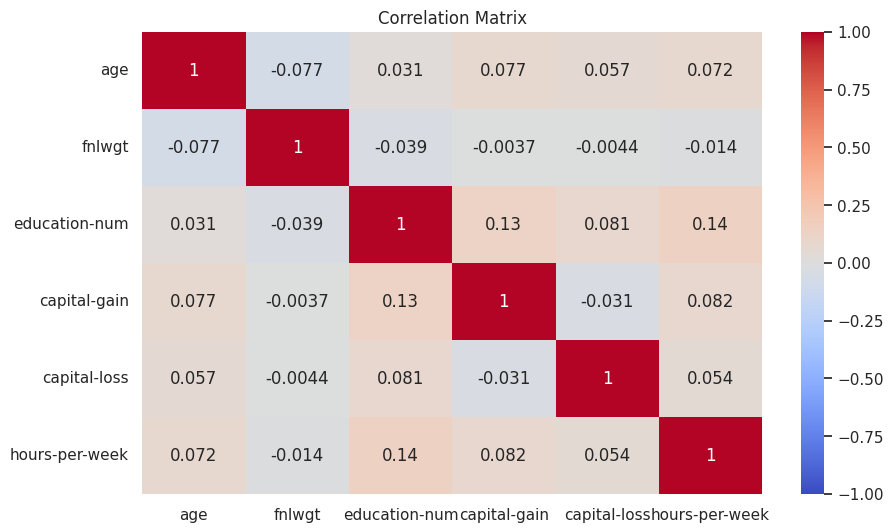

In [ ]:
# Correlation Analysis (only for numerical features)
def correlation_analysis(df):
    numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
    correlation_matrix = df[numerical_cols].corr()

    plt.figure(figsize=(10, 6))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
    plt.title('Correlation Matrix')
    plt.show()

correlation_analysis(adult_df)


**Observations:**
1.  Strong Positive Correlations:

  There's a strong positive correlation (0.75) between age and hours-per-week, indicating that older individuals tend to work more hours per week.
education-num and hours-per-week have a moderate positive correlation (0.14), suggesting that individuals with higher education levels tend to work more hours per week.
2.  Weak Positive Correlations:

  education-num and capital-gain show a weak positive correlation (0.13), indicating a slight tendency for higher education levels to be associated with higher capital gains.
3.  Weak Negative Correlations:
  
  age and fnlwgt have a weak negative correlation (-0.077), suggesting a slight tendency for older individuals to have lower final weight values.
4.  No Significant Correlations:
  
  Most other pairs of features show very weak or no correlation, indicating that they are largely independent of each other.

### PART 3 STATISTICAL ANALYSIS:

####3.1 Univariate Analysis:

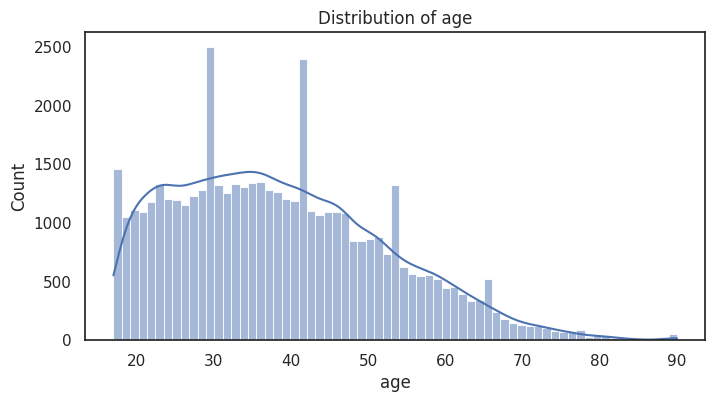

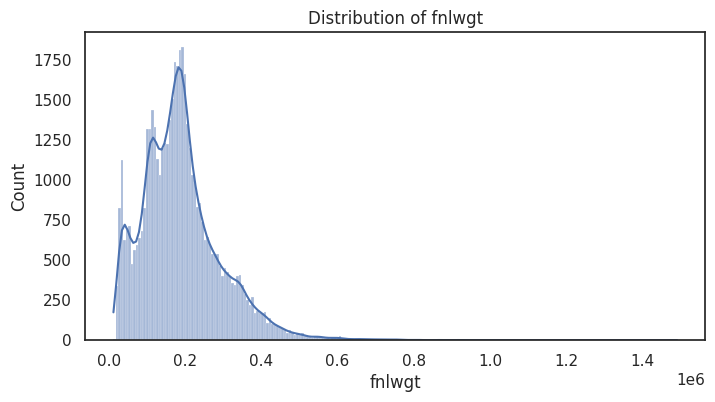

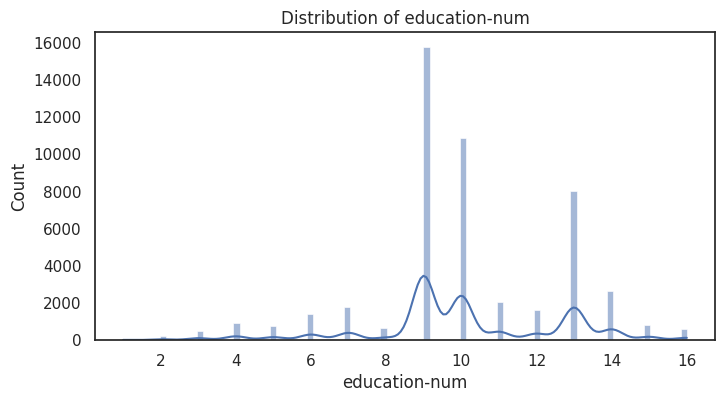

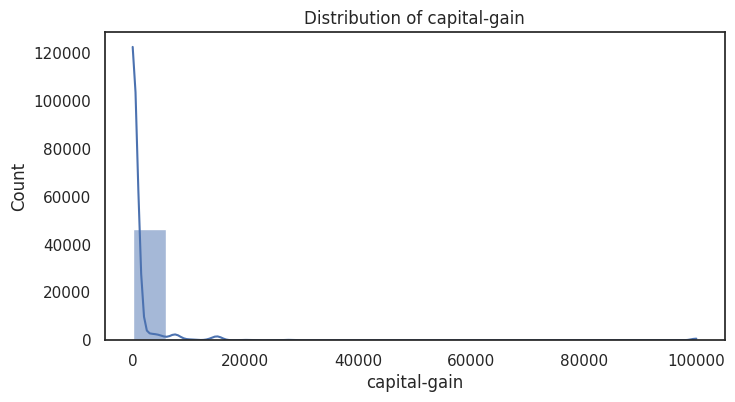

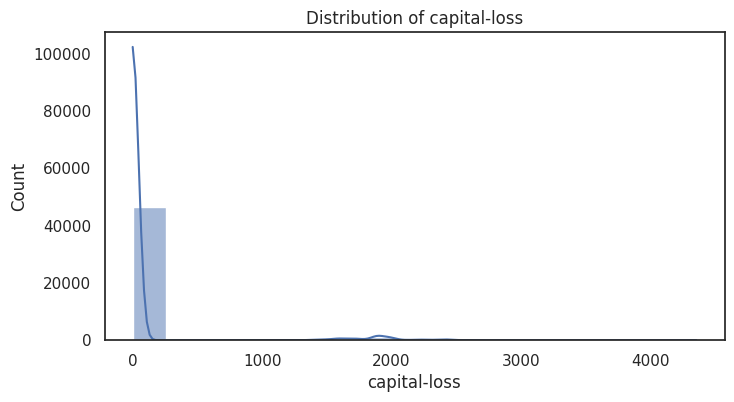

...

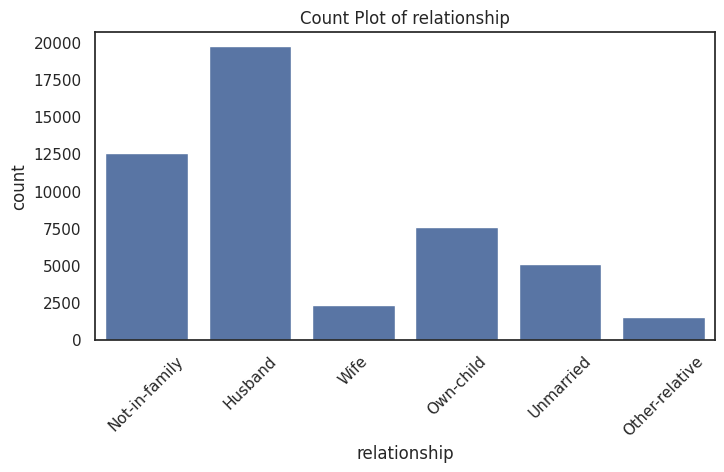

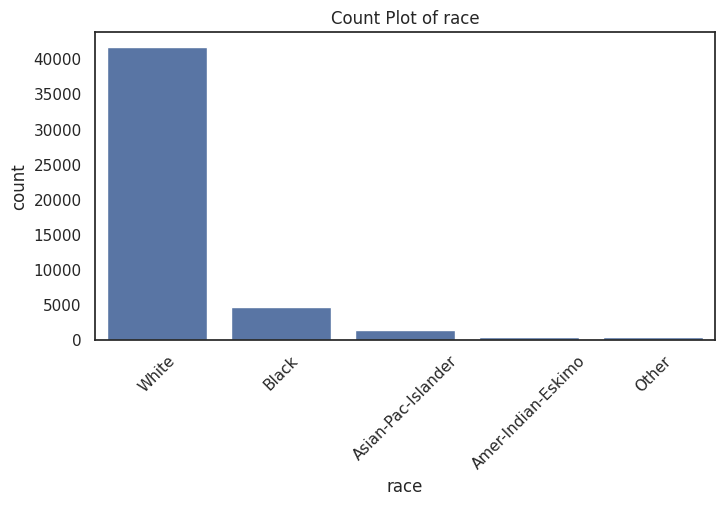

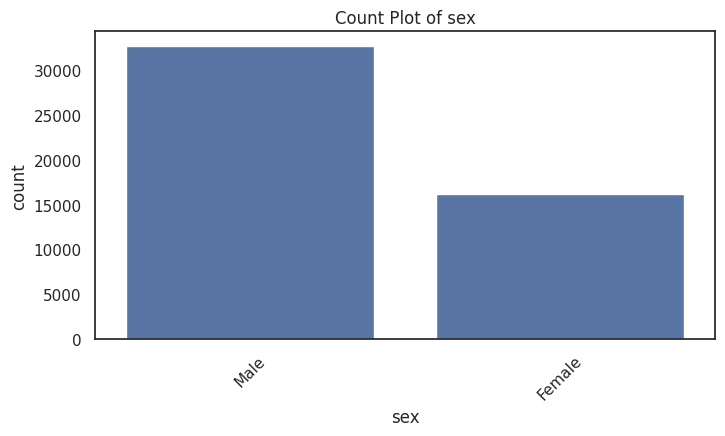

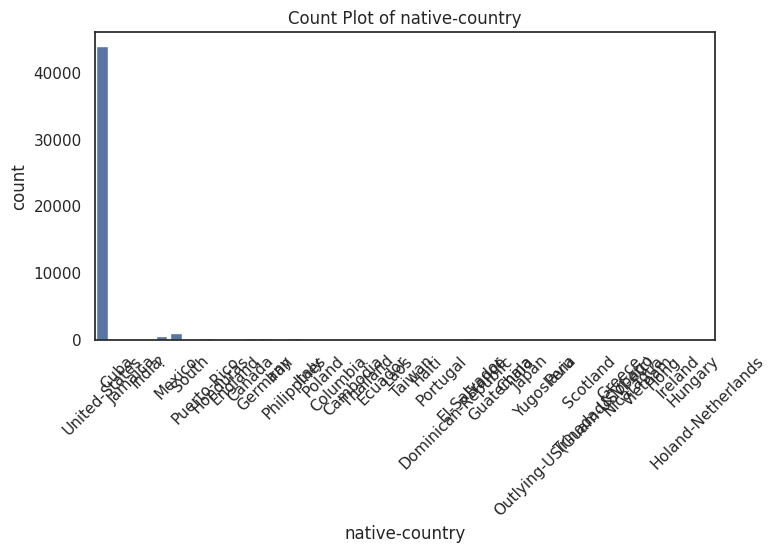

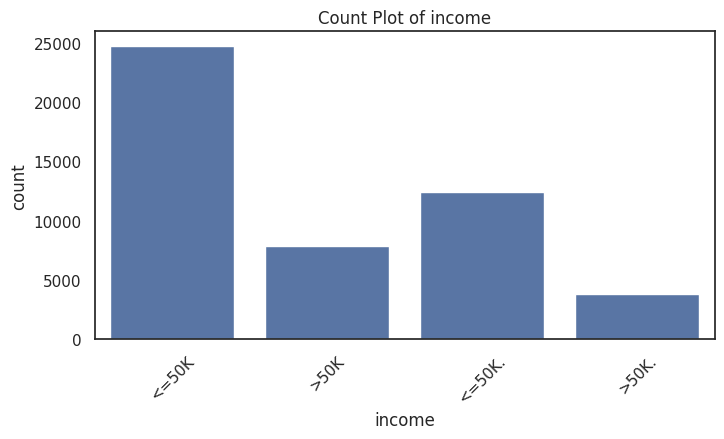

In [7]:
# Univariate Analysis: Numerical Features
def univariate_numerical(df):
    numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
    for col in numerical_cols:
        plt.figure(figsize=(8, 4))
        sns.histplot(df[col], kde=True)
        plt.title(f'Distribution of {col}')
        plt.show()

# Univariate Analysis: Categorical Features
def univariate_categorical(df):
    categorical_cols = df.select_dtypes(include=['object']).columns
    for col in categorical_cols:
        plt.figure(figsize=(8, 4))
        sns.countplot(data=df, x=col)
        plt.title(f'Count Plot of {col}')
        plt.xticks(rotation=45)
        plt.show()

# Perform univariate analysis on the dataset
univariate_numerical(adult_df)
univariate_categorical(adult_df)


####3.2 Bivariate Analysis

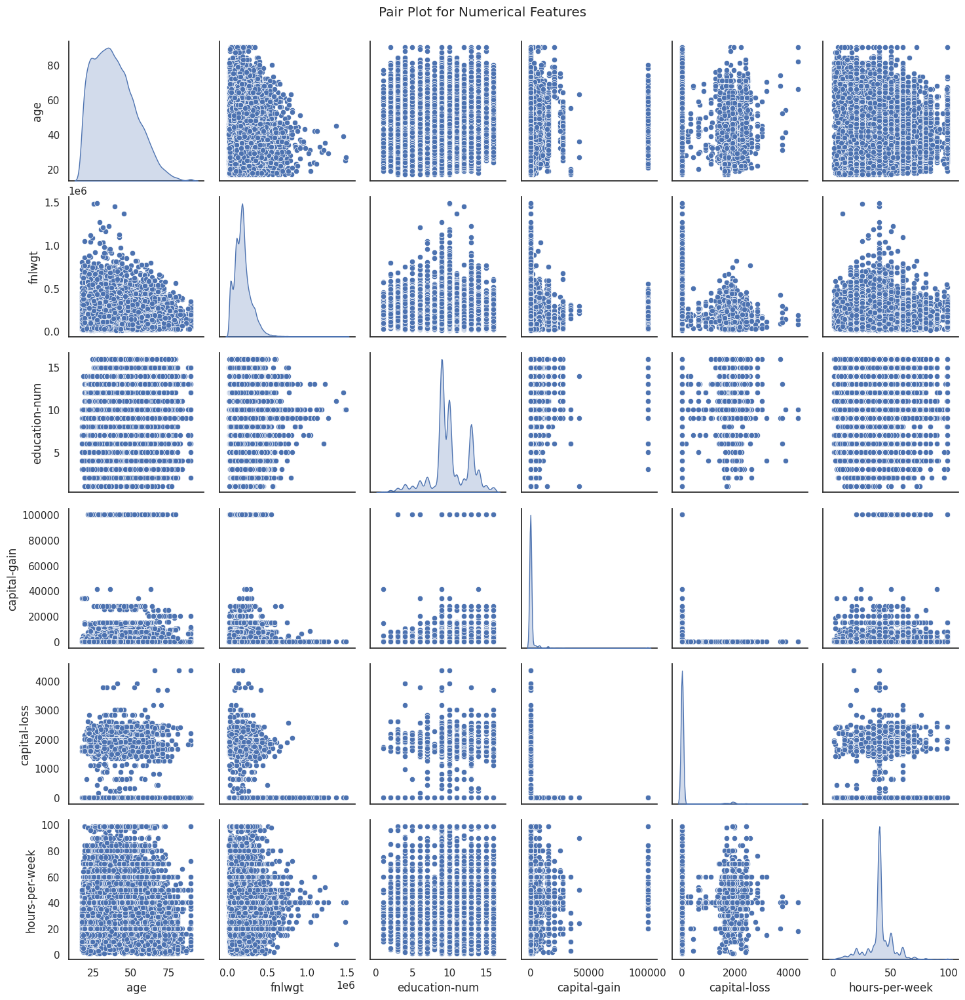

In [5]:
# Bivariate Analysis: Numerical vs Numerical
def bivariate_numerical(df):
    numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
    sns.pairplot(df[numerical_cols], diag_kind='kde')
    plt.suptitle('Pair Plot for Numerical Features', y=1.02)
    plt.show()

bivariate_numerical(adult_df)


In [8]:
adult_df.columns

Index(['age', 'workclass', 'fnlwgt', 'education', 'education-num',
       'marital-status', 'occupation', 'relationship', 'race', 'sex',
       'capital-gain', 'capital-loss', 'hours-per-week', 'native-country',
       'income'],
      dtype='object')

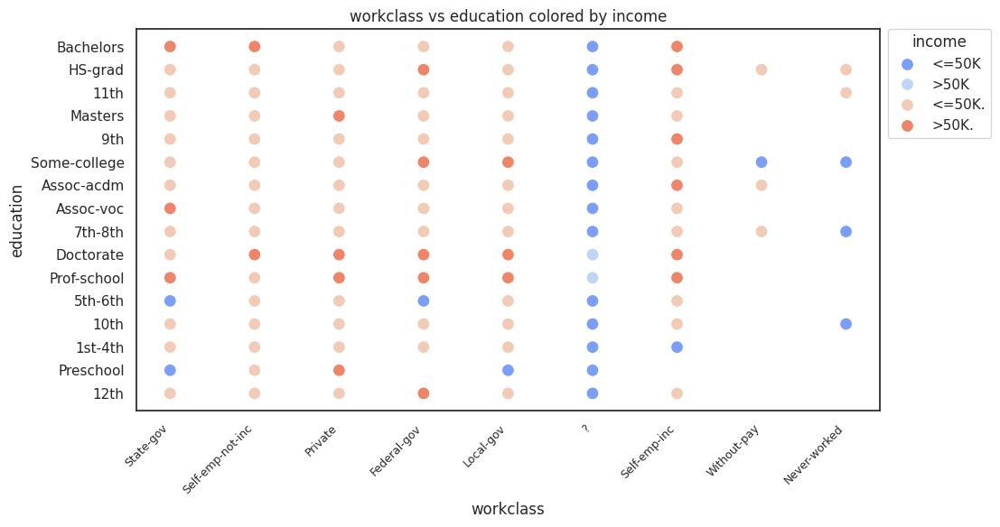

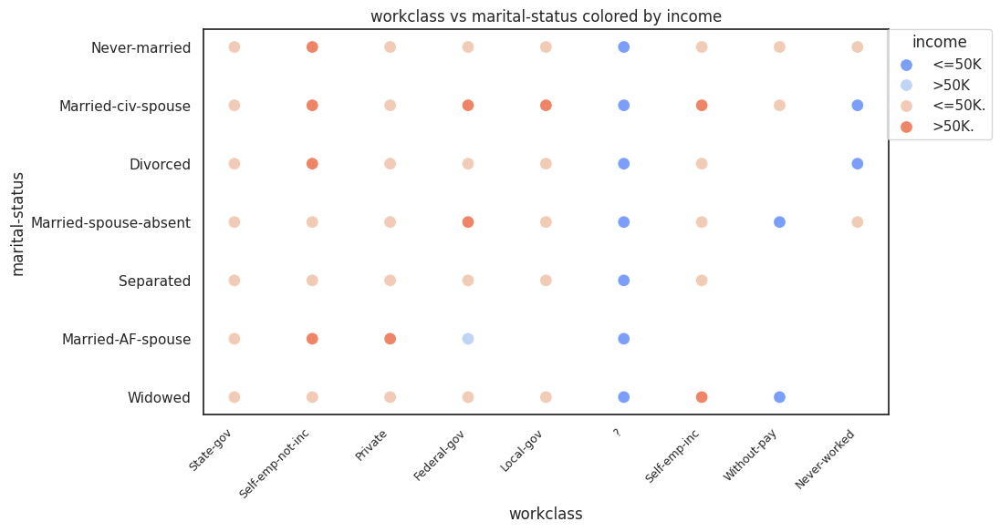

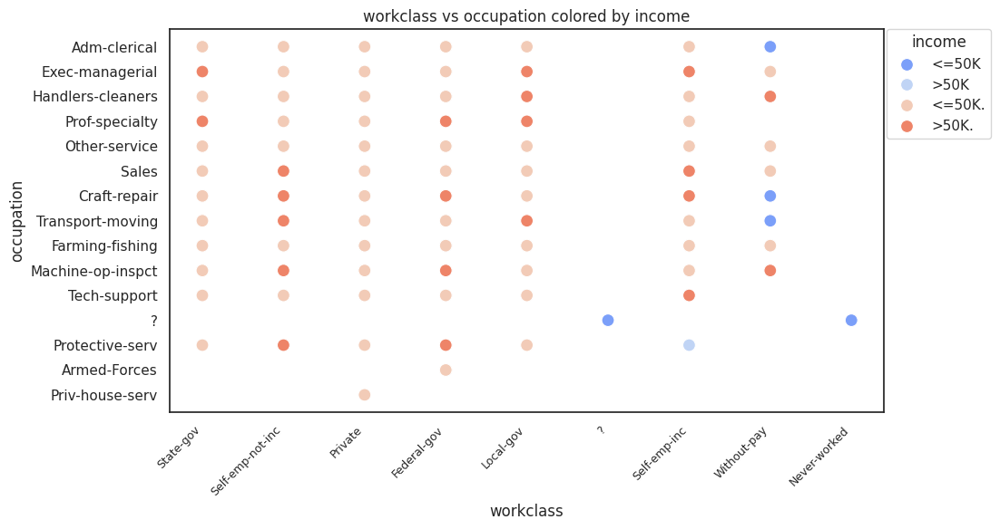

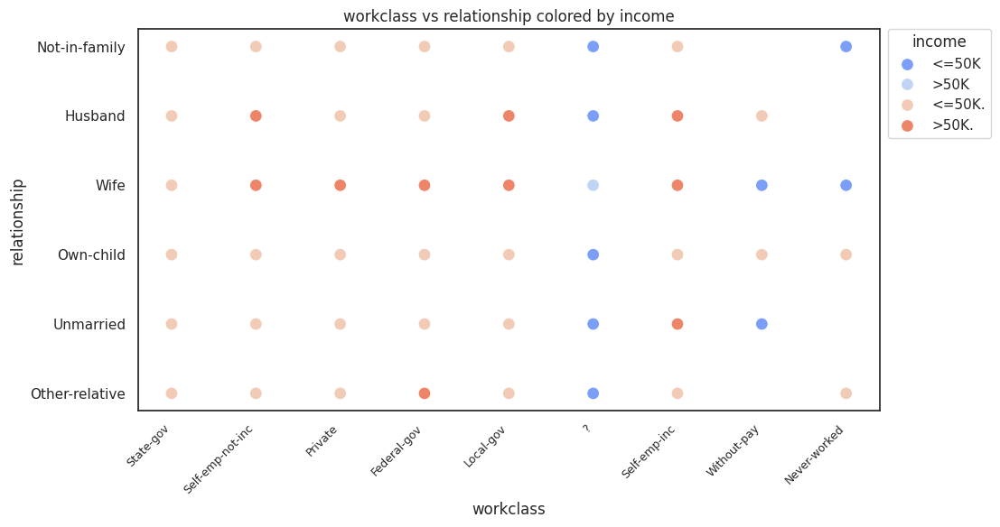

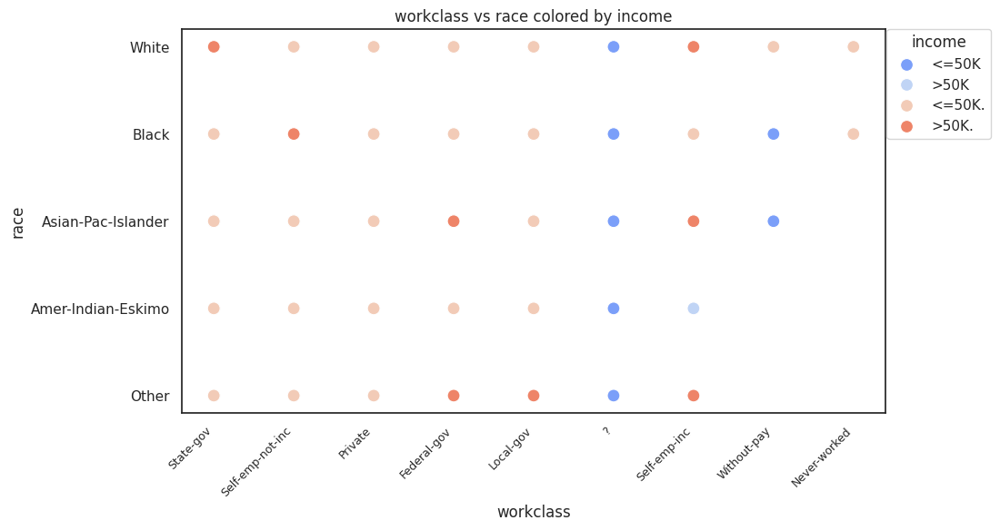

...

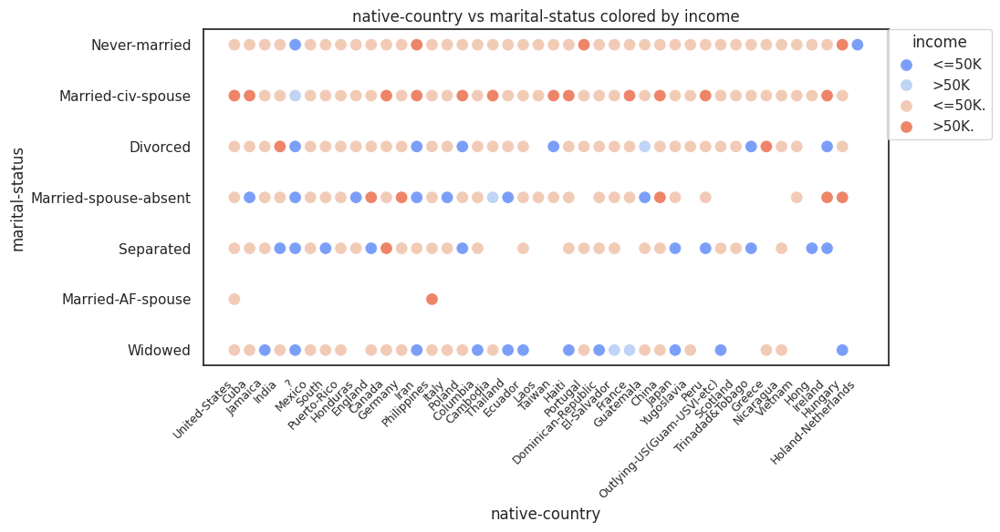

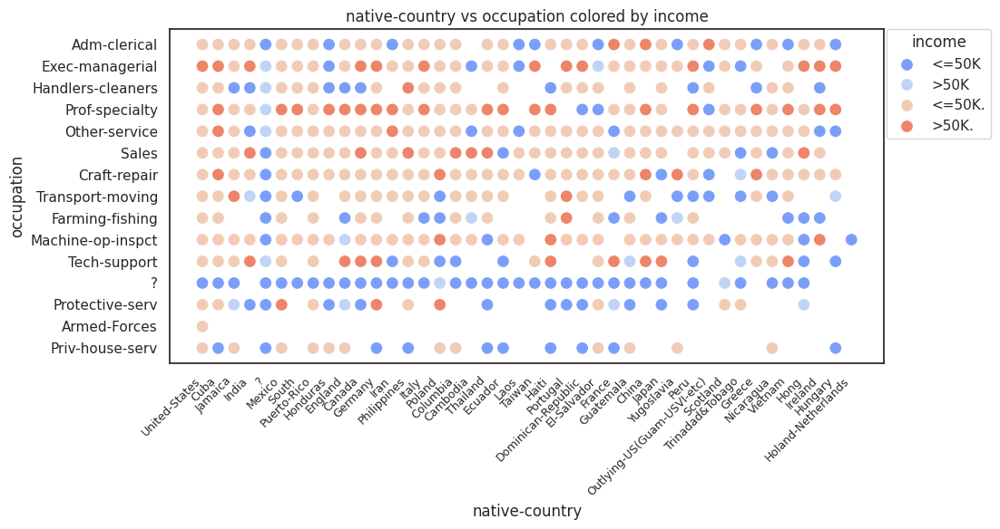

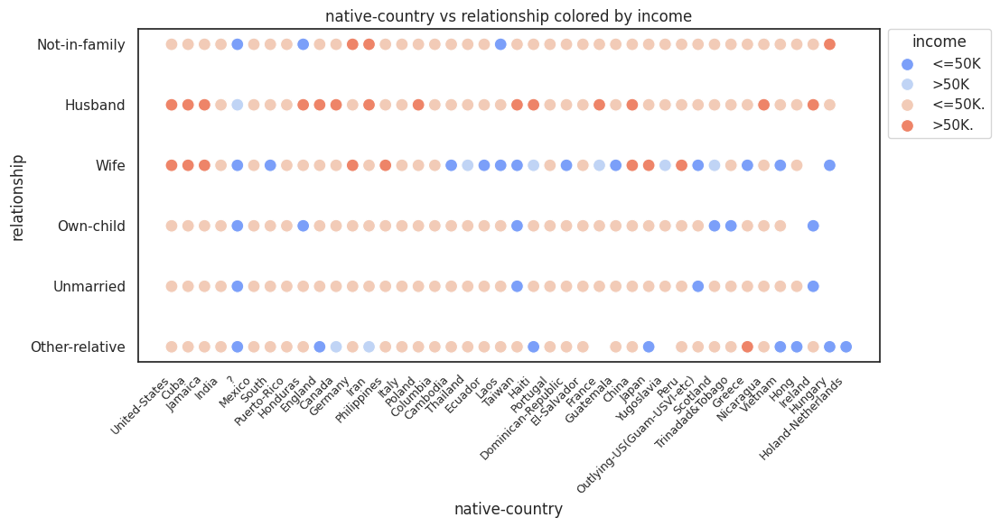

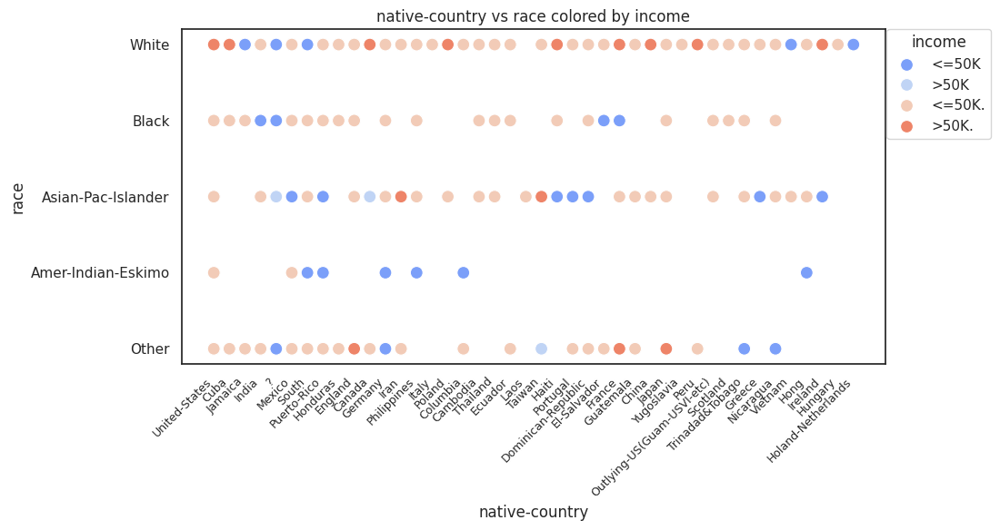

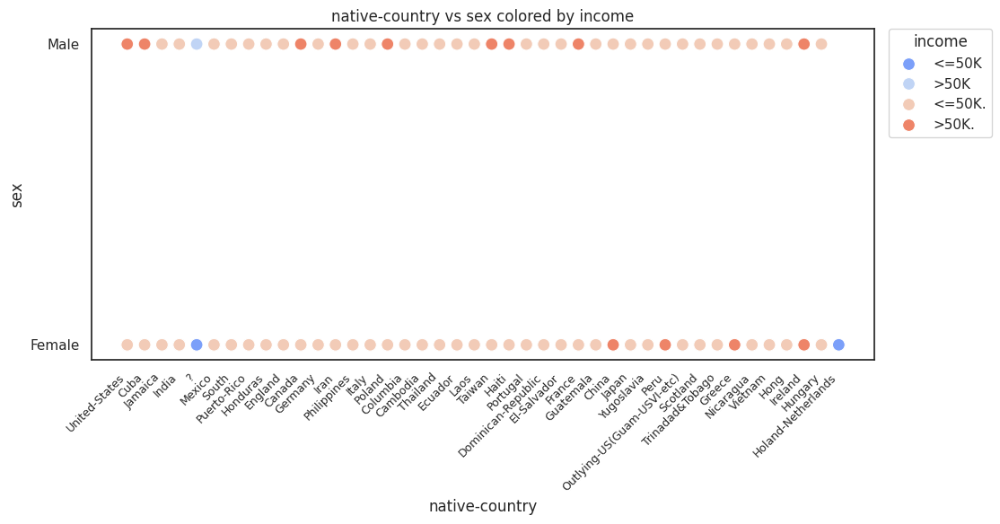

In [13]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Bivariate Analysis: Categorical vs Categorical (2D Plot with Loop)
def bivariate_categorical_2d(df, target_col):
    categorical_cols = df.select_dtypes(include=['object']).columns

    # Ensure there are at least 2 categorical columns for a 2D plot
    if len(categorical_cols) < 2:
        print("Not enough categorical columns for a 2D plot.")
        return

    # Iterate over all pairs of categorical columns
    for i, x_col in enumerate(categorical_cols):
        for j, y_col in enumerate(categorical_cols):
            if x_col != y_col and x_col != target_col and y_col != target_col:
                plt.figure(figsize=(10, 6))

                # Create the scatterplot
                scatter = sns.scatterplot(data=df, x=x_col, y=y_col, hue=target_col, palette='coolwarm', s=100)

                # Set the title and labels
                plt.title(f'{x_col} vs {y_col} colored by {target_col}')
                plt.xlabel(x_col)
                plt.ylabel(y_col)

                # Rotate x-axis labels to avoid overlapping, adjust fontsize
                plt.xticks(rotation=45, ha='right', fontsize=9)

                # Set tighter layout to avoid overlapping
                plt.tight_layout()

                # Show the legend with actual income categories
                plt.legend(title=target_col, loc='upper right', bbox_to_anchor=(1.15, 1), borderaxespad=0)

                # Display the plot
                plt.show()

# 'income' is the target column and 'adult_df' is the DataFrame
bivariate_categorical_2d(adult_df, target_col='income')


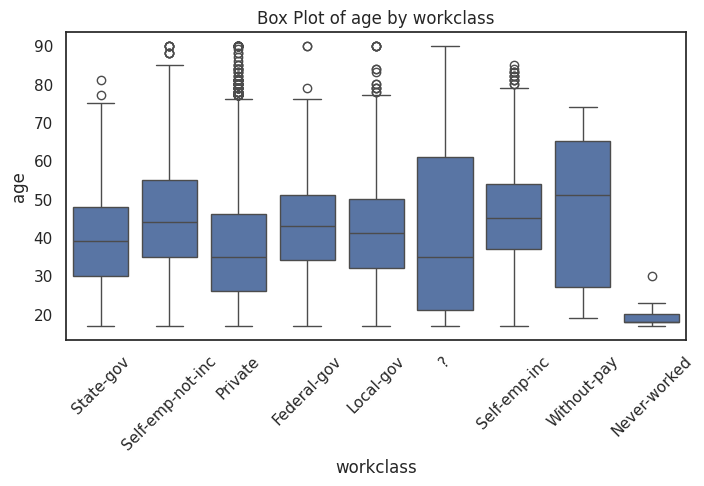

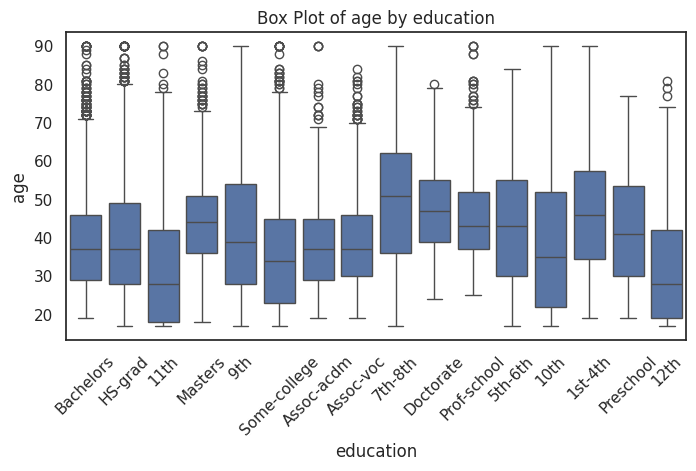

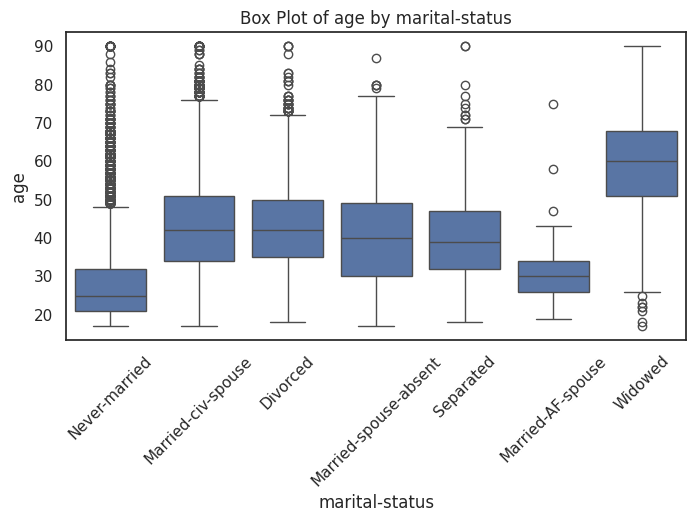

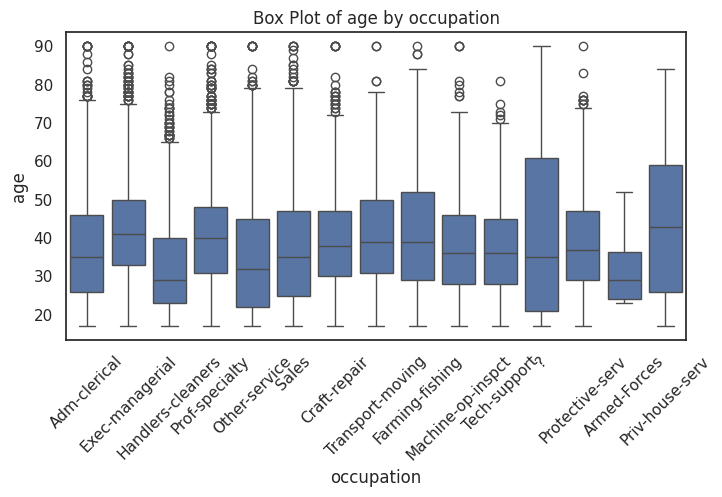

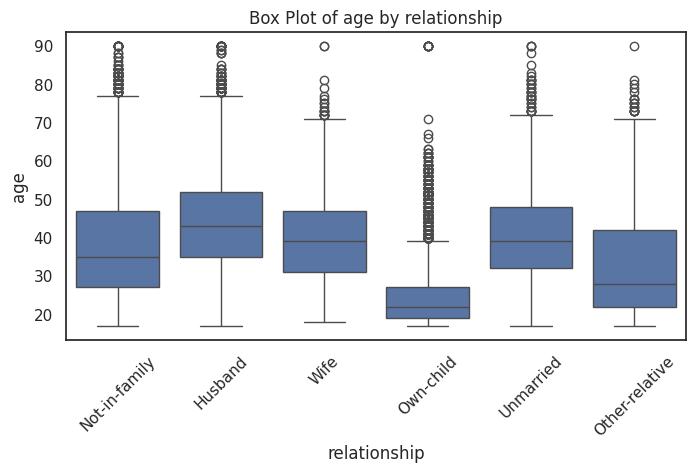

...

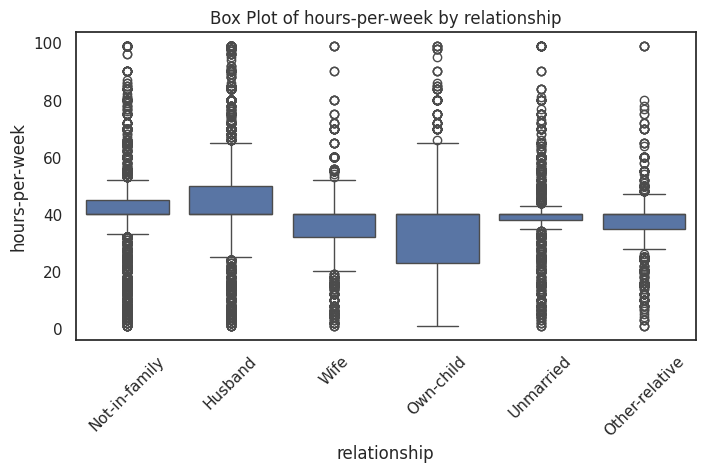

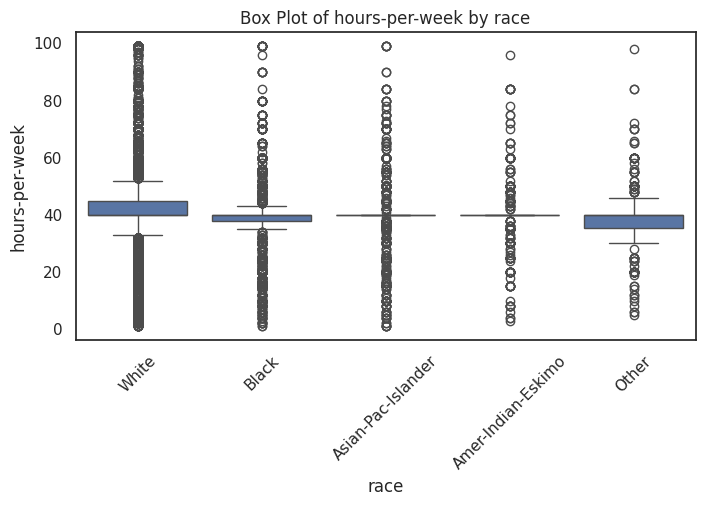

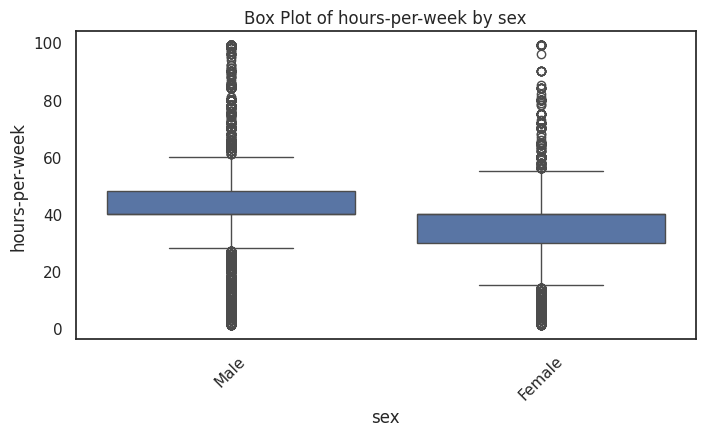

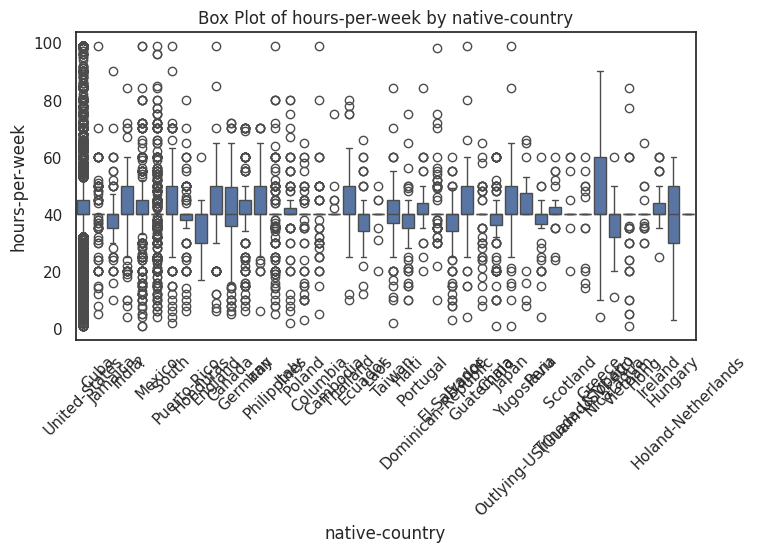

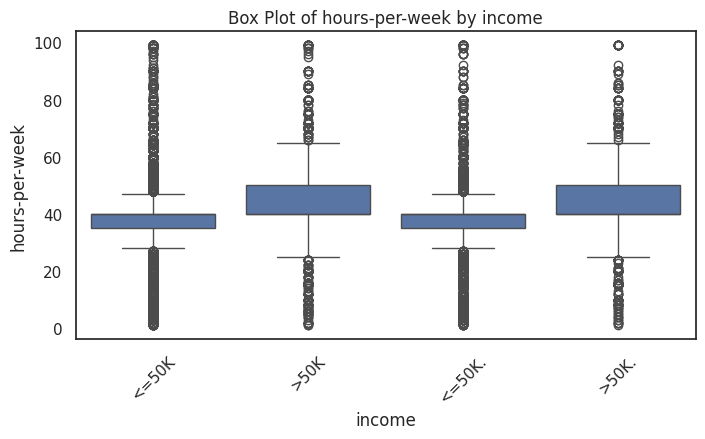

In [ ]:
# Bivariate Analysis: Categorical vs Numerical (Box Plots)
def bivariate_categorical_numerical(df, target_col):
    numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
    categorical_cols = df.select_dtypes(include=['object']).columns
    for num_col in numerical_cols:
        for cat_col in categorical_cols:
            plt.figure(figsize=(8, 4))
            sns.boxplot(x=df[cat_col], y=df[num_col])
            plt.title(f'Box Plot of {num_col} by {cat_col}')
            plt.xticks(rotation=45)
            plt.show()

bivariate_categorical_numerical(adult_df, target_col='income')  # Assuming 'income' is categorical


#### 3.3 Statistical Tests



Chi-Square Test between workclass and income:
Chi2 Statistic: 2451.9360532600394
p-value: 0.0
Degrees of Freedom: 24





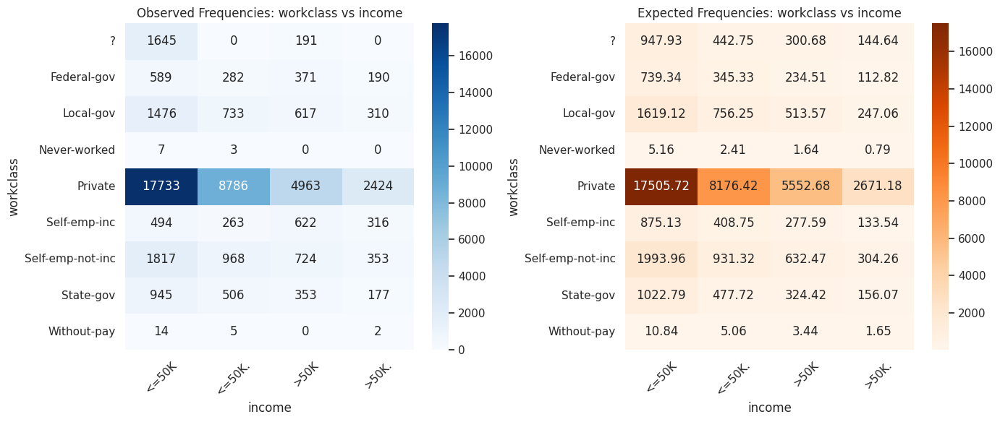



Chi-Square Test between education and income:
Chi2 Statistic: 6565.747997481039
p-value: 0.0
Degrees of Freedom: 45





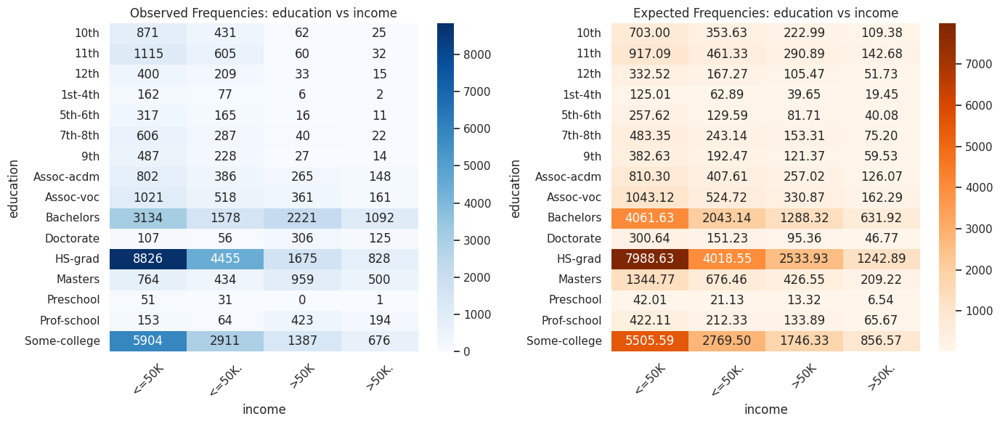



Chi-Square Test between marital-status and income:
Chi2 Statistic: 9821.002385989445
p-value: 0.0
Degrees of Freedom: 18





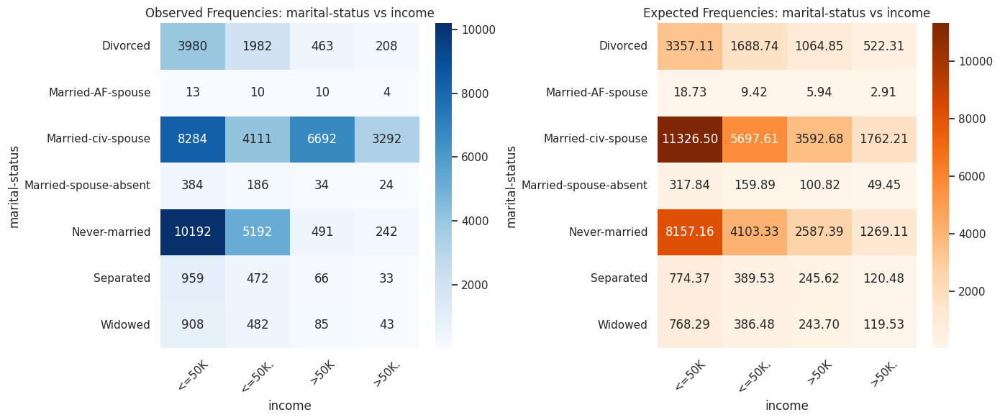



Chi-Square Test between occupation and income:
Chi2 Statistic: 6804.761911723583
p-value: 0.0
Degrees of Freedom: 42





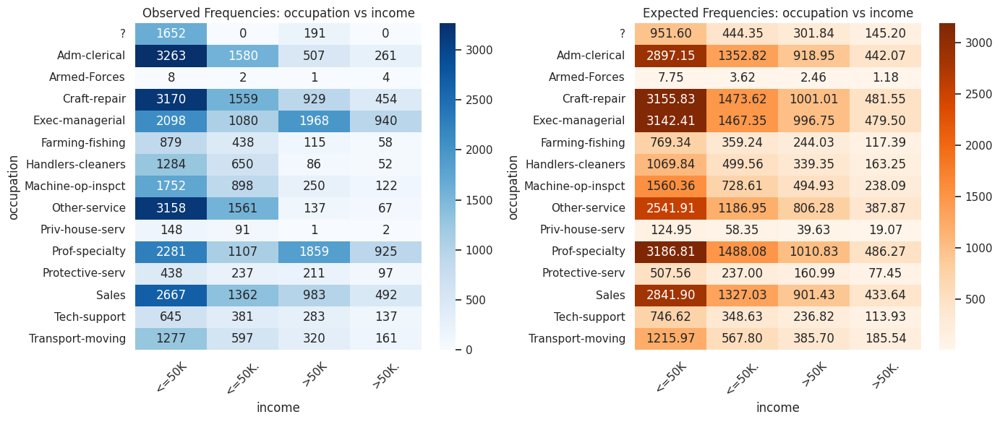



Chi-Square Test between relationship and income:
Chi2 Statistic: 10097.378584105087
p-value: 0.0
Degrees of Freedom: 15





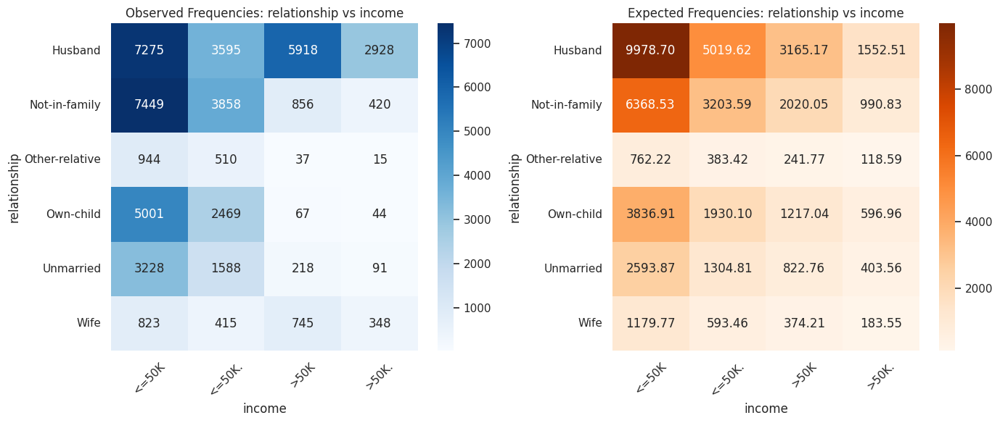



Chi-Square Test between race and income:
Chi2 Statistic: 494.40660244965846
p-value: 3.4347723295010175e-98
Degrees of Freedom: 12





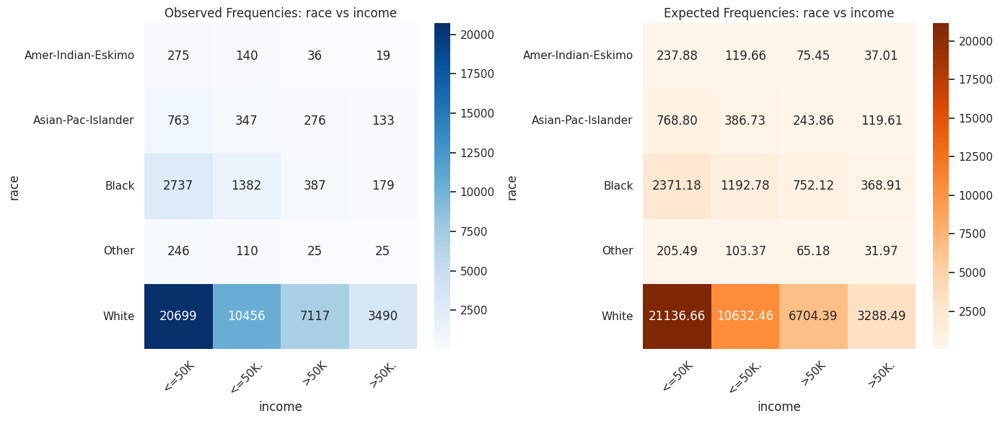



Chi-Square Test between sex and income:
Chi2 Statistic: 2250.03235834128
p-value: 0.0
Degrees of Freedom: 3





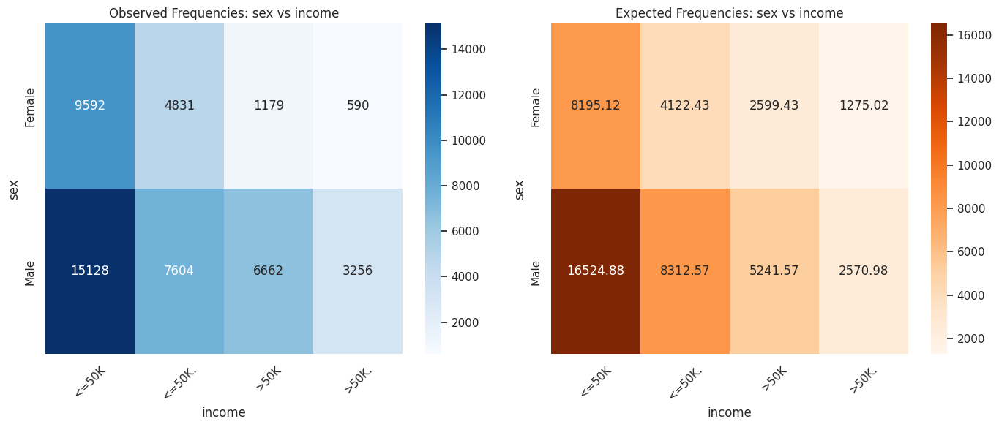



Chi-Square Test between native-country and income:
Chi2 Statistic: 814.2561280423544
p-value: 2.1525667073421703e-102
Degrees of Freedom: 123





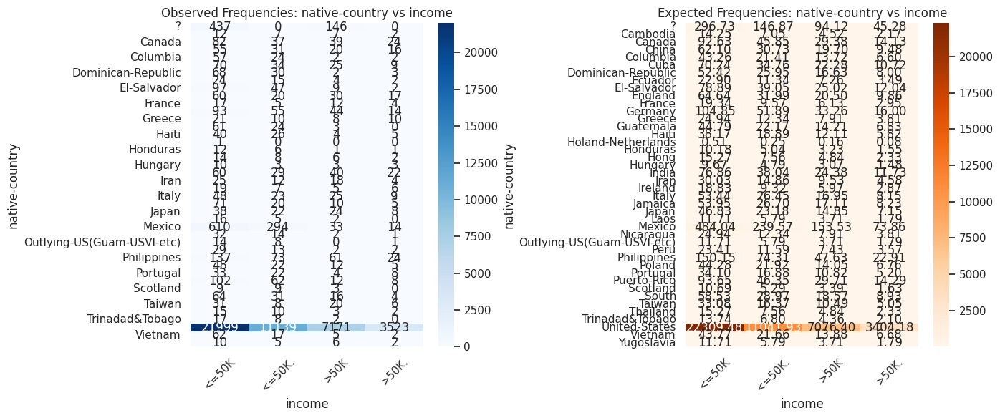

In [18]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency

# Chi-Square Test: Categorical vs Categorical with Side-by-Side Heatmaps
def chi_square_test_with_side_by_side_plots(df, target_col):
    categorical_cols = df.select_dtypes(include=['object']).columns

    for col in categorical_cols:
        if col != target_col:
            # Create a cross-tabulation of the two categorical variables (Observed Frequencies)
            crosstab = pd.crosstab(df[col], df[target_col])

            # Perform the Chi-Square test
            chi2, p, dof, expected = chi2_contingency(crosstab)

            # Print the Chi-Square test results
            print(f'\n\nChi-Square Test between {col} and {target_col}:')
            print(f'Chi2 Statistic: {chi2}')
            print(f'p-value: {p}')
            print(f'Degrees of Freedom: {dof}')
            # print(f'Expected Frequencies:\n{expected}')
            print('\n\n')

            # Plot side-by-side heatmaps of observed vs expected frequencies
            fig, axes = plt.subplots(1, 2, figsize=(14, 6))

            # Observed frequencies heatmap (on the left)
            sns.heatmap(crosstab, annot=True, fmt='d', cmap='Blues', cbar=True, ax=axes[0])
            axes[0].set_title(f'Observed Frequencies: {col} vs {target_col}')
            axes[0].set_xlabel(target_col)
            axes[0].set_ylabel(col)
            axes[0].tick_params(axis='x', rotation=45)

            # Expected frequencies heatmap (on the right)
            sns.heatmap(expected, annot=True, fmt='.2f', cmap='Oranges', cbar=True,
                        xticklabels=crosstab.columns, yticklabels=crosstab.index, ax=axes[1])
            axes[1].set_title(f'Expected Frequencies: {col} vs {target_col}')
            axes[1].set_xlabel(target_col)
            axes[1].set_ylabel(col)
            axes[1].tick_params(axis='x', rotation=45)

            # Adjust layout to prevent overlap
            plt.tight_layout()

            # Display the plot
            plt.show()

# Assuming 'income' is the target column and 'adult_df' is the DataFrame
chi_square_test_with_side_by_side_plots(adult_df, target_col='income')


The Chi-Square test indicates a highly significant relationship between sex and income (p-value: 0.0, which is less than the typical 0.05 threshold). This means that the observed differences in income between males and females are unlikely to have occurred by chance alone.

**Observed vs. Expected Frequencies:**

The heatmaps illustrate the differences between observed and expected frequencies. Lets take an example of Chi-Square Test between sex and income:
1.  Observed Frequencies: The left heatmap shows that a higher proportion of males fall into the higher income categories compared to females.
2.  Expected Frequencies: The right heatmap shows the expected frequencies if there were no relationship between sex and income.

Correlation between age and fnlwgt:
Pearson Correlation: -0.07662807893178855, p-value: 1.637759384761327e-64
Spearman Correlation: -0.07750419429937262, p-value: 5.870181313692103e-66
Kendall Correlation: -0.052382502826637395, p-value: 3.5644695822359415e-66






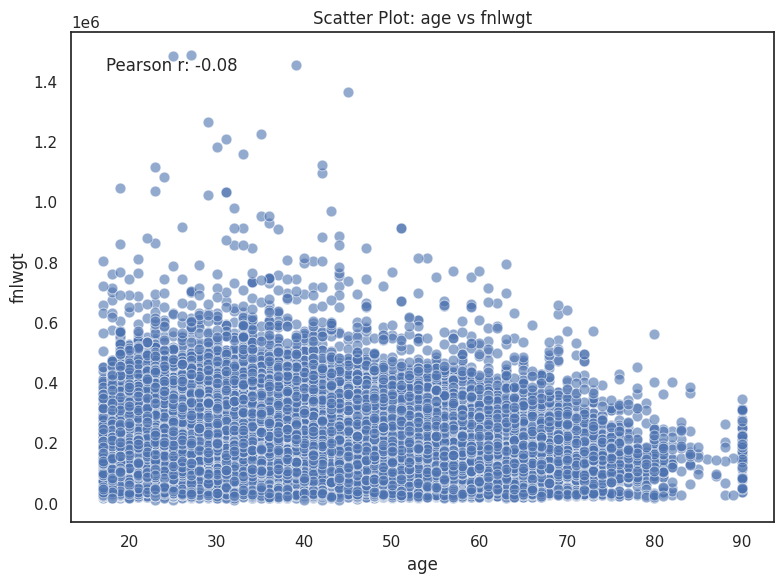

Correlation between age and education-num:
Pearson Correlation: 0.03094037587451402, p-value: 7.955032710144095e-12
Spearman Correlation: 0.0632122643093882, p-value: 1.9607787095505234e-44
Kendall Correlation: 0.05085610633426857, p-value: 1.7051828914270099e-53






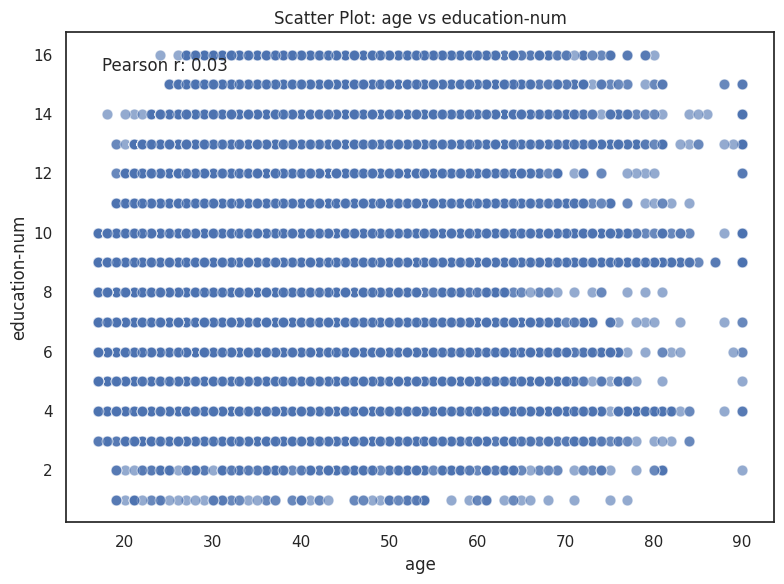

Correlation between age and capital-gain:
Pearson Correlation: 0.07722902236438103, p-value: 1.6767458105932849e-65
Spearman Correlation: 0.12443564850017708, p-value: 9.116099844857211e-168
Kendall Correlation: 0.10067709151525127, p-value: 1.565574825151622e-166






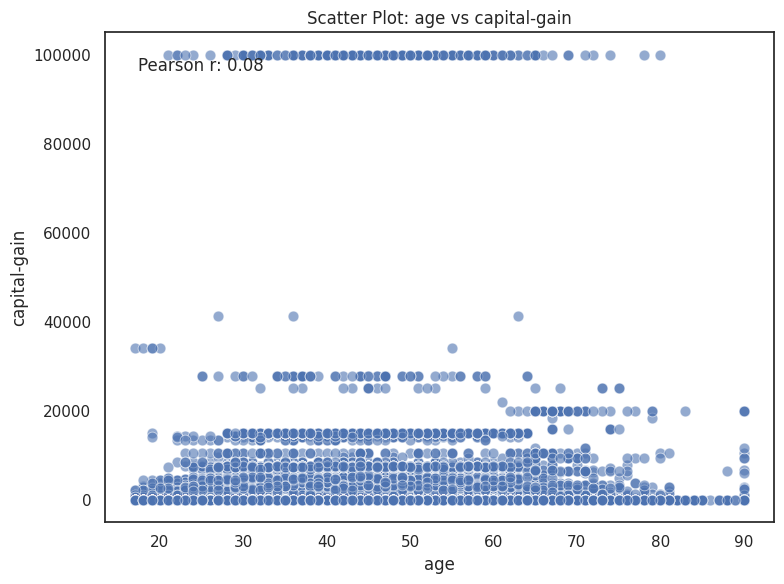

Correlation between age and capital-loss:
Pearson Correlation: 0.05694382610561194, p-value: 2.2606932678744332e-36
Spearman Correlation: 0.05758371789071025, p-value: 3.7124947223077746e-37
Kendall Correlation: 0.04705765411266745, p-value: 3.327095816351388e-37






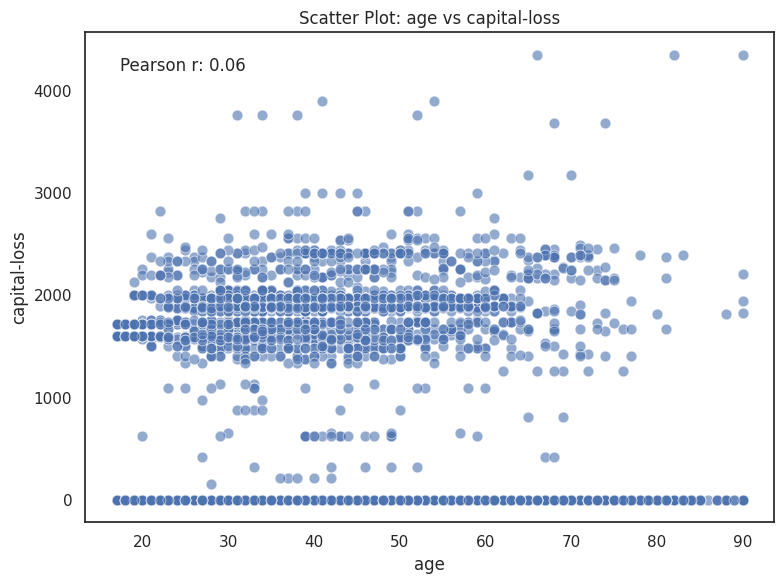

Correlation between age and hours-per-week:
Pearson Correlation: 0.07155833852698296, p-value: 1.8002403626406189e-56
Spearman Correlation: 0.1466042624502149, p-value: 9.212956408264413e-233
Kendall Correlation: 0.11100103033149182, p-value: 3.338127047920732e-247






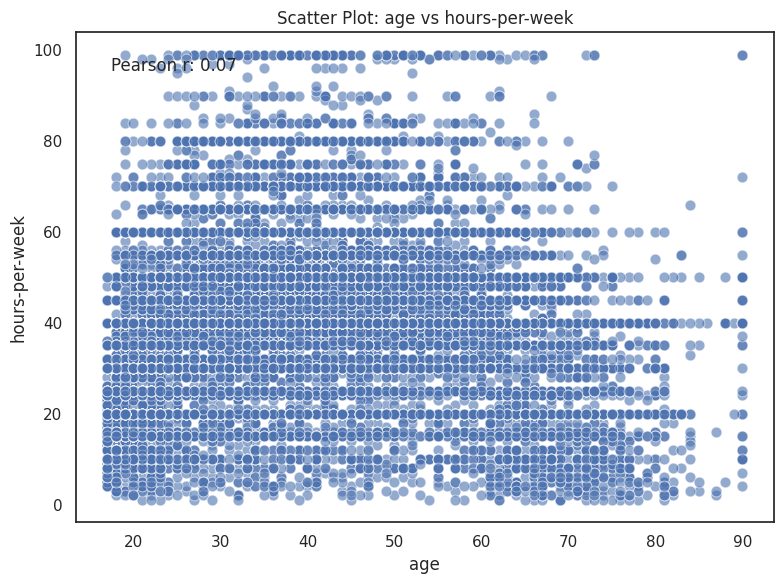

Correlation between fnlwgt and education-num:
Pearson Correlation: -0.03876068354971028, p-value: 1.042068598268227e-17
Spearman Correlation: -0.029643010232347965, p-value: 5.6602775455675805e-11
Kendall Correlation: -0.021378329837917955, p-value: 6.124658313903675e-11






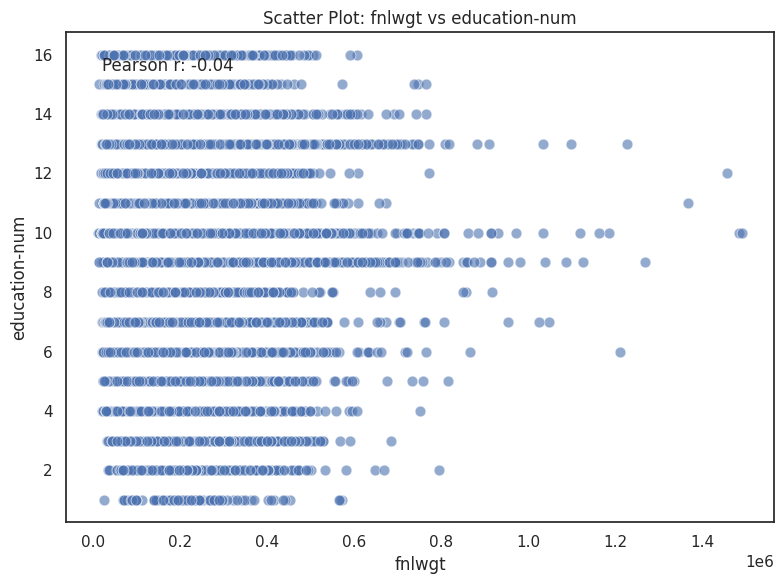

Correlation between fnlwgt and capital-gain:
Pearson Correlation: -0.003706388611082727, p-value: 0.41272815371723776
Spearman Correlation: -0.008754846561449132, p-value: 0.05301135008869939
Kendall Correlation: -0.007000543847565177, p-value: 0.05328396685411533






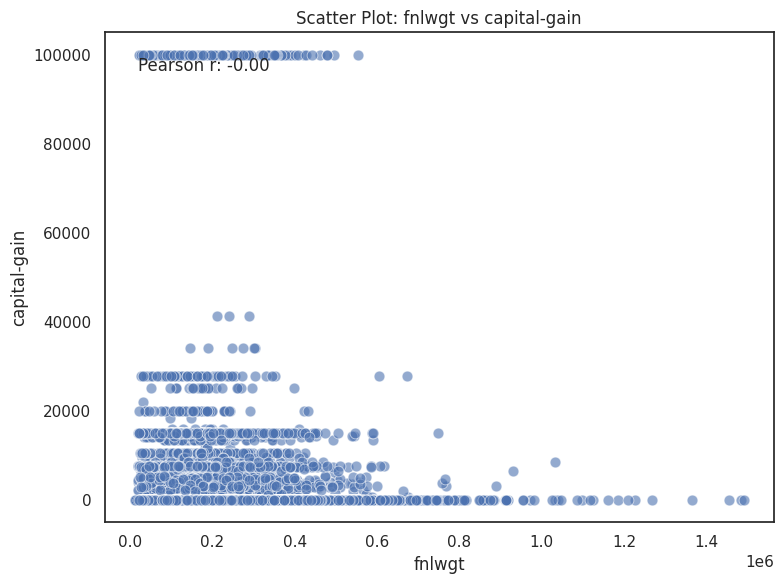

Correlation between fnlwgt and capital-loss:
Pearson Correlation: -0.00436614967949547, p-value: 0.33459046308193563
Spearman Correlation: -0.0009443424613124746, p-value: 0.8346851525322208
Kendall Correlation: -0.0007706600266676799, p-value: 0.8329507072780049






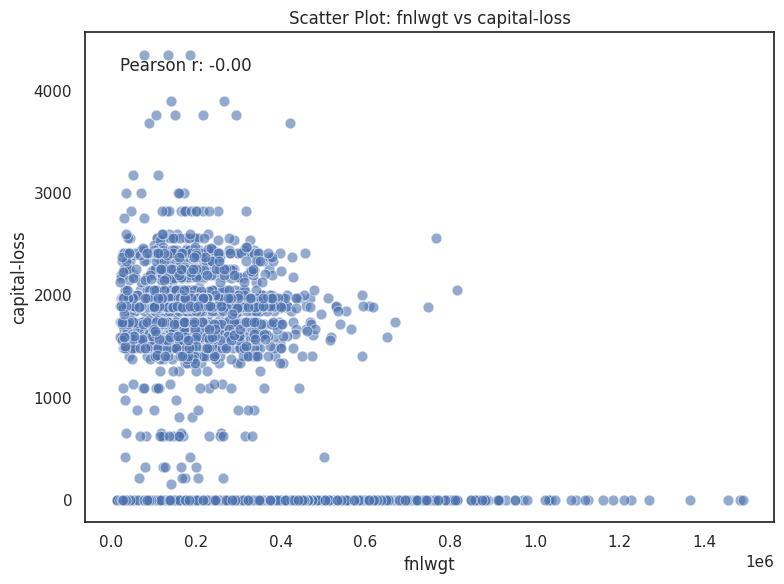

Correlation between fnlwgt and hours-per-week:
Pearson Correlation: -0.013518714690561439, p-value: 0.0028106087205725197
Spearman Correlation: -0.01633435191849228, p-value: 0.00030610593075272086
Kendall Correlation: -0.011817977193752958, p-value: 0.00030298569166255983






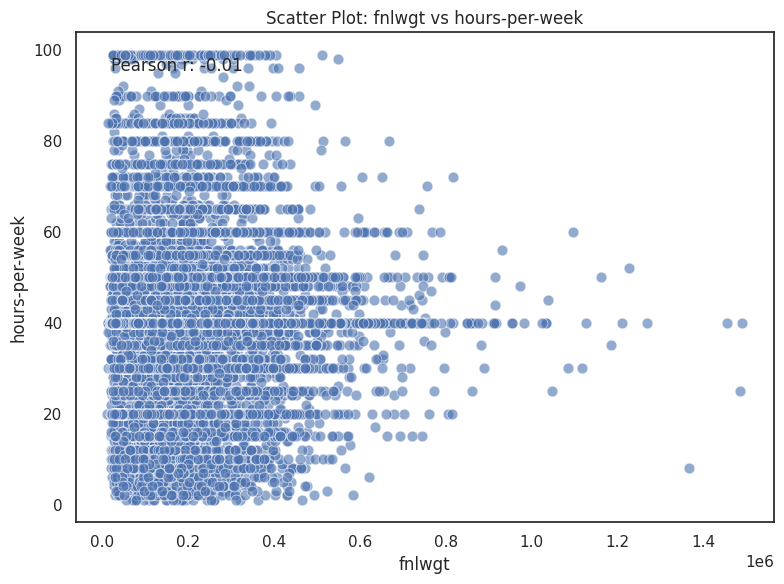

Correlation between education-num and capital-gain:
Pearson Correlation: 0.12514645910572125, p-value: 1.1120086892421983e-169
Spearman Correlation: 0.11887147722293678, p-value: 3.5738171001641307e-153
Kendall Correlation: 0.1033583186175469, p-value: 7.429784667822325e-153






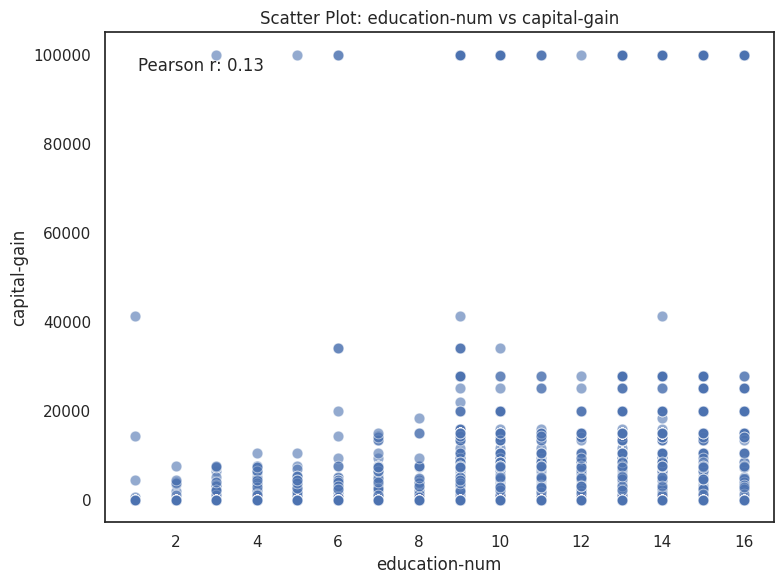

Correlation between education-num and capital-loss:
Pearson Correlation: 0.08097193774847265, p-value: 7.667188265686044e-72
Spearman Correlation: 0.07701684481777189, p-value: 3.7568292148289286e-65
Kendall Correlation: 0.06748753693030683, p-value: 3.6330501055568507e-65






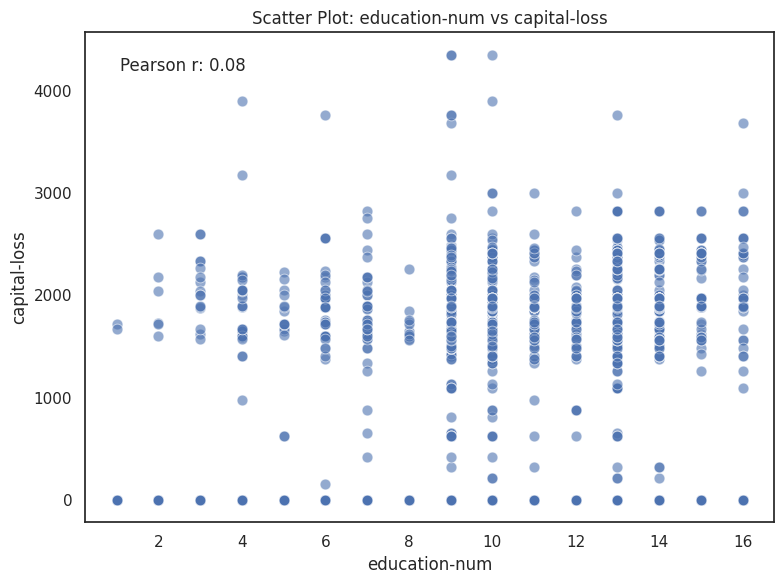

Correlation between education-num and hours-per-week:
Pearson Correlation: 0.1436889093924772, p-value: 1.3860285325417135e-223
Spearman Correlation: 0.16443698800348566, p-value: 4.226589488968517e-293
Kendall Correlation: 0.12975565032498307, p-value: 1.9174035223162803e-293






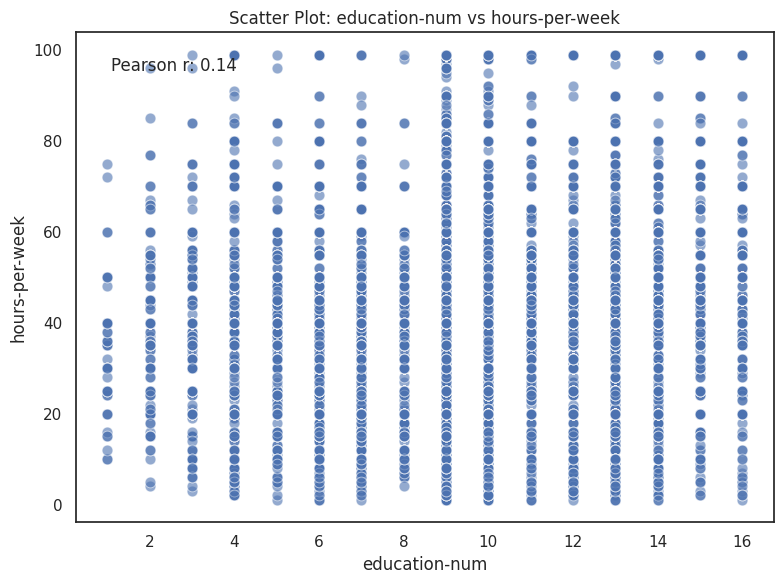

Correlation between capital-gain and capital-loss:
Pearson Correlation: -0.03144077064746279, p-value: 3.652300961564179e-12
Spearman Correlation: -0.06632843871568463, p-value: 9.387662961244928e-49
Kendall Correlation: -0.06431093583991089, p-value: 1.1872189416970064e-48






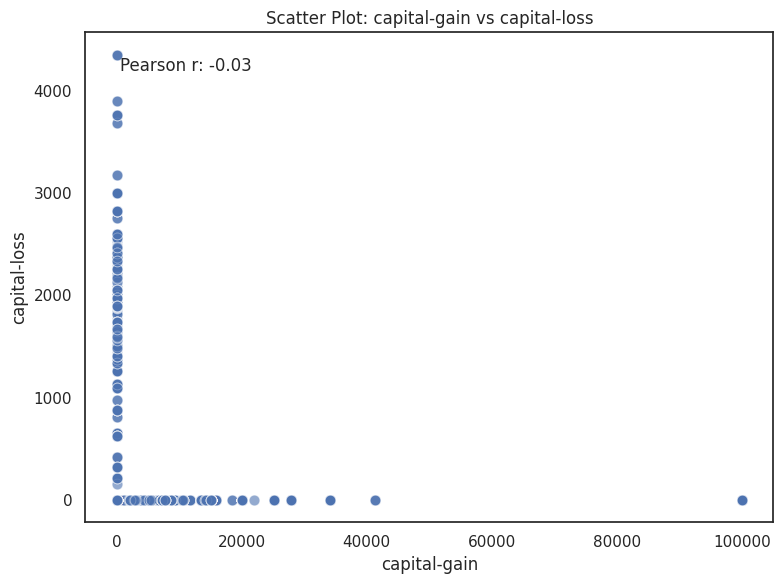

Correlation between capital-gain and hours-per-week:
Pearson Correlation: 0.08215727805587827, p-value: 6.515014114163052e-74
Spearman Correlation: 0.0919141290095747, p-value: 4.123818908526055e-92
Kendall Correlation: 0.07997123459693202, p-value: 3.768402628686636e-92






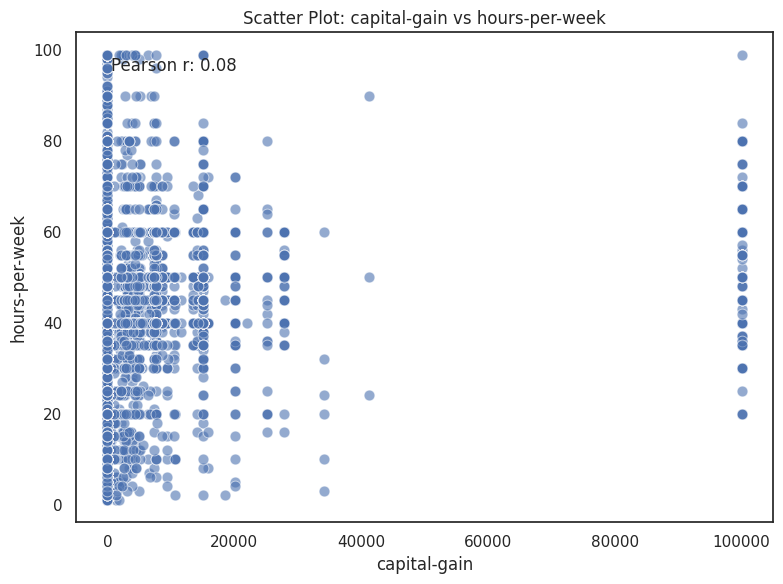

Correlation between capital-loss and hours-per-week:
Pearson Correlation: 0.05446721609518671, p-value: 2.035631265139578e-33
Spearman Correlation: 0.06006325377762532, p-value: 2.7996237870947198e-40
Kendall Correlation: 0.05264318708856357, p-value: 2.750301990060143e-40






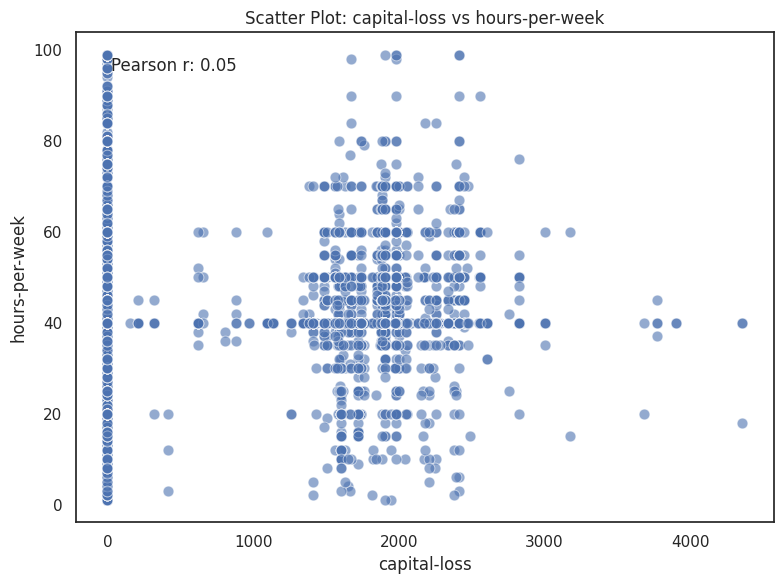

In [16]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, spearmanr, kendalltau

# Correlation Analysis: Pearson, Spearman, Kendall with Scatter Plot
def correlation_tests_with_plots(df):
    numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns

    for i in range(len(numerical_cols)):
        for j in range(i + 1, len(numerical_cols)):
            col1, col2 = numerical_cols[i], numerical_cols[j]

            # Pearson Correlation
            pearson_corr, pearson_p = pearsonr(df[col1], df[col2])
            # Spearman Correlation
            spearman_corr, spearman_p = spearmanr(df[col1], df[col2])
            # Kendall Correlation
            kendall_corr, kendall_p = kendalltau(df[col1], df[col2])

            # Print the correlation results
            print(f'Correlation between {col1} and {col2}:')
            print(f'Pearson Correlation: {pearson_corr}, p-value: {pearson_p}')
            print(f'Spearman Correlation: {spearman_corr}, p-value: {spearman_p}')
            print(f'Kendall Correlation: {kendall_corr}, p-value: {kendall_p}')
            print('\n\n\n')

            # Plot a scatter plot with Pearson correlation value annotated
            plt.figure(figsize=(8, 6))
            sns.scatterplot(x=df[col1], y=df[col2], alpha=0.6, s=60)

            # Annotate the Pearson correlation on the plot
            plt.text(0.05, 0.95, f'Pearson r: {pearson_corr:.2f}',
                     transform=plt.gca().transAxes, fontsize=12, verticalalignment='top')

            # Set plot title and labels
            plt.title(f'Scatter Plot: {col1} vs {col2}')
            plt.xlabel(col1)
            plt.ylabel(col2)

            # Improve layout and display the plot
            plt.tight_layout()
            plt.show()

# Assuming 'adult_df' is the DataFrame
correlation_tests_with_plots(adult_df)
